# This notebook examines the CAM outputs from running the warm rain microphysics emulator.

In [1]:
# Import packages
%matplotlib inline
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import matplotlib.colors as colors
import seaborn as sns

In [90]:
!ls /glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/

cam_ml_tauREV4_train.cam.h0.2005-01.nc
cam_ml_tauREV4_train.cam.h0.2005-02.nc
cam_ml_tauREV4_train.cam.h0.2005-03.nc
cam_ml_tauREV4_train.cam.h0.2005-04.nc
cam_ml_tauREV4_train.cam.h0.2005-05.nc
cam_ml_tauREV4_train.cam.h0.2005-06.nc
cam_ml_tauREV4_train.cam.h0.2005-07.nc
cam_ml_tauREV4_train.cam.h0.2005-08.nc
cam_ml_tauREV4_train.cam.h0.2005-09.nc
cam_ml_tauREV4_train.cam.h0.2005-10.nc
cam_ml_tauREV4_train.cam.h0.2005-11.nc
cam_ml_tauREV4_train.cam.h0.2005-12.nc
cam_ml_tauREV4_train.cam.h0.2006-01.nc
cam_ml_tauREV4_train.cam.h0.2006-02.nc
cam_ml_tauREV4_train.cam.h0.2006-03.nc
cam_ml_tauREV4_train.cam.h0.2006-04.nc
cam_ml_tauREV4_train.cam.h0.2006-05.nc
cam_ml_tauREV4_train.cam.h0.2006-06.nc
cam_ml_tauREV4_train.cam.h0.2006-07.nc
cam_ml_tauREV4_train.cam.h0.2006-08.nc
cam_ml_tauREV4_train.cam.h0.2006-09.nc
cam_ml_tauREV4_train.cam.h0.2006-10.nc
cam_ml_tauREV4_train.cam.h0.2006-11.nc
cam_ml_tauREV4_train.cam.h0.2006-12.nc
cam_ml_tauREV4_train.cam.h1.2005-01-01-00000.nc
cam_ml_tauREV4_t

In [91]:
!ls /glade/derecho/scratch/wchuang/archive/run11_1month/atm/hist/

run11_1month.cam.h0.2005-01.nc
run11_1month.cam.h1.2005-01-01-00000.nc
run11_1month.cam.h1.2005-01-31-57600.nc


In [92]:
# Set directory for figure outputs
pwd = "/glade/u/home/wchuang/mlmicrophysics/notebooks/figs/cam_diagnostics/"

# Grab subset of data
subset = ["cam.h0.*"]
# Load original data
datapath0 = "/glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/cam_ml_tauREV4_train.cam.h0.*.nc"
datafile0 = xr.open_mfdataset(datapath0, combine="by_coords")
datapath1 = "/glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/cam_ml_tauREV4_train.cam.h1.*.nc"
datafile1 = xr.open_mfdataset(datapath1, combine="by_coords")

# Load emulator results
directory = "/glade/derecho/scratch/wchuang/archive/"
case = "run12_3nn_add_CLD_lev_FREQR"
nnpath0 = directory + case + "/atm/hist/" + case + ".cam.h0.*.nc"
nnfile0 = xr.open_mfdataset(nnpath0, combine="by_coords")
nnpath1 = directory + case + "/atm/hist/" + case + ".cam.h1.*.nc"
nnfile1 = xr.open_mfdataset(nnpath1, combine="by_coords")

In [93]:
datapath2 = "/glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/cam_ml_tauREV4_train.cam.h1.2005-01-01-00000.nc"
datafile2 = xr.open_mfdataset(datapath2, combine="by_coords")

In [94]:
datafile0

<xarray.Dataset>
Dimensions:           (lat: 192, lon: 288, time: 24, lev: 32, ilev: 33,
                       trop_cld_lev: 32, nbnd: 2)
Coordinates:
  * lat               (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon               (lon) float64 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
  * lev               (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * ilev              (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * trop_cld_lev      (trop_cld_lev) float64 3.643 7.595 14.36 ... 976.3 992.6
  * time              (time) object 2005-02-01 00:00:00 ... 2007-01-01 00:00:00
Dimensions without coordinates: nbnd
Data variables: (12/589)
    gw                (time, lat) float64 dask.array<chunksize=(1, 192), meta=np.ndarray>
    hyam              (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    hybm              (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    P0                (time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05 1e+05
    hyai              (time, ilev) float64 dask.array<chunksize=(1, 33), meta=np.ndarray>
    hybi              (time, ilev) float64 dask.array<chunksize=(1, 33), meta=np.ndarray>
    ...                ...
    RTP2_CLUBB        (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    THLP2_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    RTPTHLP_CLUBB     (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPRCP_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPTHVP_CLUBB      (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    ZM_CLUBB          (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              cam_ml_tauREV4_train
    logname:           andrew
    host:              derecho4
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  month_1

Analyzing the h0 files

In [137]:
# Pressure-time
# Pressure-latitude
# CLDICE, CLDLIQ, physics tendencies
# Droplet concentration
# Cloud fraction, precipitation fraction

variables = ["PS",
             "CLDICE",
             "CLDLIQ",
             "ACTNL",
             "CDNUMC",
]
labels = ["Surface Pressure (Pa)",
          "Grid Box Averaged Cloud Ice Amount (kg/kg)",
          "Grid Box Averaged Cloud Liquid Amount (kg/kg)",
          "Average Cloud Top Droplet Number (m-3)",
          "Vertically Integrated Droplet Concentration (m-2)",
         ]
cols = ["{}".format(col) for col in ["TAU microphysics",
                                     "TAU emulator",
                                     "Emulator - Data",
                                     ]
]

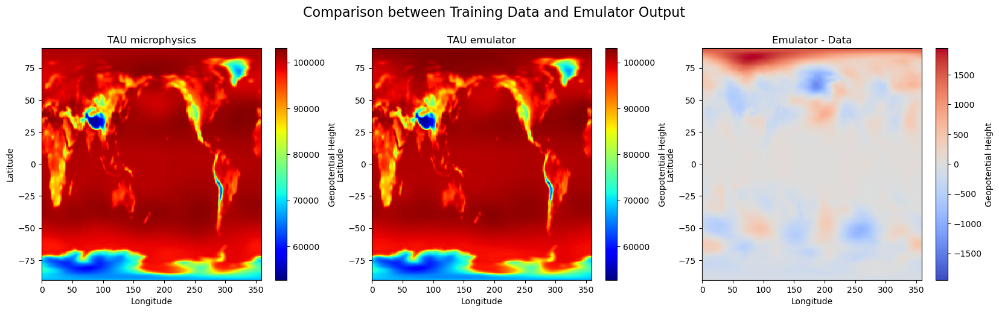

In [111]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), transform=ccrs.PlateCarree())

# Choose a timestep and examine pressure
ps_data_0 = datafile0.PS.sel({"time": datafile0.PS.time.values[0]}) # .squeeze()
ps_nn_0 = nnfile0.PS.sel({"time": datafile0.PS.time.values[0]}) # .squeeze()

# define the colormap
cmap = mpl.colormaps["jet"]
minimum = np.min([ps_data_0.min().values.item(), ps_nn_0.min().values.item()])
maximum = np.max([ps_data_0.max().values.item(), ps_nn_0.max().values.item()])

# Plot the data
datamesh = axes[0].pcolormesh(ps_data_0.lon, ps_data_0.lat, ps_data_0, cmap=cmap, vmin=minimum, vmax=maximum)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
plt.colorbar(datamesh, ax=axes[0], label=labels[0])

# Plot the emulator
nnmesh = axes[1].pcolormesh(ps_nn_0.lon, ps_nn_0.lat, ps_nn_0, cmap=cmap, vmin=minimum, vmax=maximum)
plt.colorbar(nnmesh, ax=axes[1], label=labels[0])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Plot difference
ps_diff_0 = ps_nn_0 - ps_data_0
min_diff = np.min(ps_diff_0.min().values.item())
max_diff = np.max(ps_diff_0.max().values.item())
abs_diff = max(abs(min_diff), abs(max_diff))
z = np.linspace(-abs_diff, abs_diff)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
diffmesh = axes[2].pcolormesh(ps_diff_0.lon, ps_diff_0.lat, ps_diff_0, norm=norm, cmap="coolwarm")
plt.colorbar(diffmesh, ax=axes[2], label=labels[0])
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")

for ax, col in zip(axes, cols):
    ax.set_title(col)
# plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

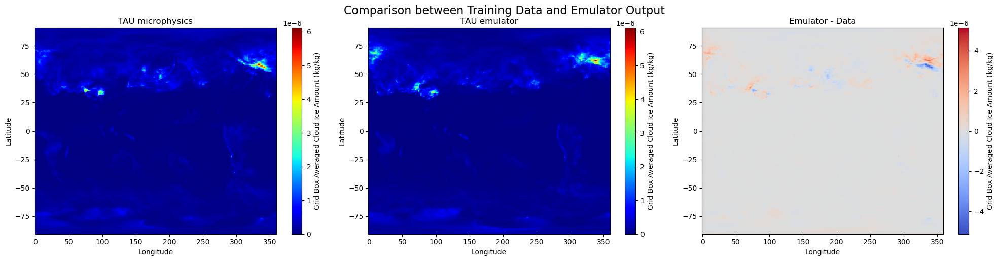

In [138]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), transform=ccrs.PlateCarree())

# Choose a timestep and atmospheric level
cldice_data_0 = datafile0.CLDICE.sel({"time": datafile0.CLDICE.time.values[0], "lev": datafile0.CLDICE.lev.values[20]}) # .squeeze()
cldice_nn_0 = nnfile0.CLDICE.sel({"time": datafile0.CLDICE.time.values[0], "lev": datafile0.CLDICE.lev.values[20]}) # .squeeze()

# define the colormap
cmap = mpl.colormaps["jet"]
minimum = np.min([cldice_data_0.min().values.item(), cldice_nn_0.min().values.item()])
maximum = np.max([cldice_data_0.max().values.item(), cldice_nn_0.max().values.item()])

# Plot the data
datamesh = axes[0].pcolormesh(cldice_data_0.lon, cldice_data_0.lat, cldice_data_0, cmap=cmap, vmin=minimum, vmax=maximum)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
plt.colorbar(datamesh, ax=axes[0], label=labels[1])

# Plot the emulator
nnmesh = axes[1].pcolormesh(cldice_nn_0.lon, cldice_nn_0.lat, cldice_nn_0, cmap=cmap, vmin=minimum, vmax=maximum)
plt.colorbar(nnmesh, ax=axes[1], label=labels[1])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Plot difference
cldice_diff_0 = cldice_nn_0 - cldice_data_0
min_diff = np.min(cldice_diff_0.min().values.item())
max_diff = np.max(cldice_diff_0.max().values.item())
abs_diff = max(abs(min_diff), abs(max_diff))
z = np.linspace(-abs_diff, abs_diff)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
diffmesh = axes[2].pcolormesh(cldice_diff_0.lon, cldice_diff_0.lat, cldice_diff_0, norm=norm, cmap="coolwarm")
plt.colorbar(diffmesh, ax=axes[2], label=labels[1])
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")

for ax, col in zip(axes, cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

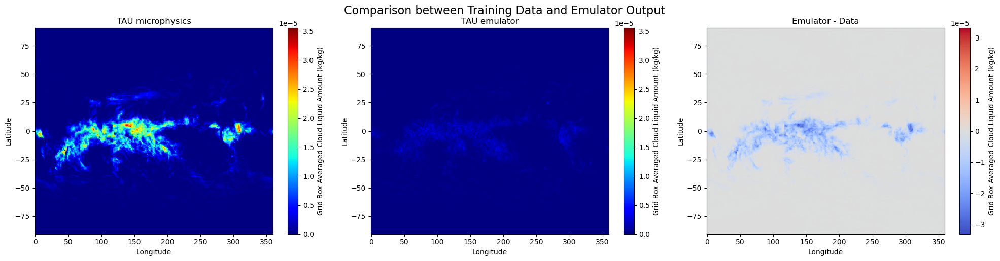

In [139]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), transform=ccrs.PlateCarree())

# Choose a timestep and atmospheric level
cldliq_data_0 = datafile0.CLDLIQ.sel({"time": datafile0.CLDLIQ.time.values[0], "lev": datafile0.CLDLIQ.lev.values[20]}) # .squeeze()
cldliq_nn_0 = nnfile0.CLDLIQ.sel({"time": datafile0.CLDLIQ.time.values[0], "lev": datafile0.CLDLIQ.lev.values[20]}) # .squeeze()

# define the colormap
cmap = mpl.colormaps["jet"]
minimum = np.min([cldliq_data_0.min().values.item(), cldliq_nn_0.min().values.item()])
maximum = np.max([cldliq_data_0.max().values.item(), cldliq_nn_0.max().values.item()])

# Plot the data
datamesh = axes[0].pcolormesh(cldliq_data_0.lon, cldliq_data_0.lat, cldliq_data_0, cmap=cmap, vmin=minimum, vmax=maximum)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
plt.colorbar(datamesh, ax=axes[0], label=labels[2])

# Plot the emulator
nnmesh = axes[1].pcolormesh(cldliq_nn_0.lon, cldliq_nn_0.lat, cldliq_nn_0, cmap=cmap, vmin=minimum, vmax=maximum)
plt.colorbar(nnmesh, ax=axes[1], label=labels[2])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Plot difference
cldliq_diff_0 = cldliq_nn_0 - cldliq_data_0
min_diff = np.min(cldliq_diff_0.min().values.item())
max_diff = np.max(cldliq_diff_0.max().values.item())
abs_diff = max(abs(min_diff), abs(max_diff))
z = np.linspace(-abs_diff, abs_diff)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
diffmesh = axes[2].pcolormesh(cldliq_diff_0.lon, cldliq_diff_0.lat, cldliq_diff_0, norm=norm, cmap="coolwarm")
plt.colorbar(diffmesh, ax=axes[2], label=labels[2])
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")

for ax, col in zip(axes, cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

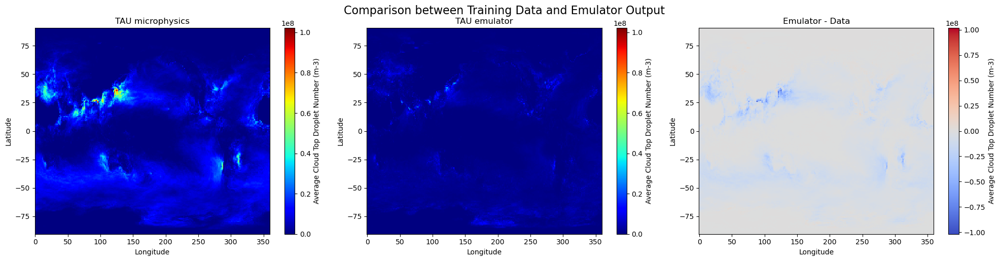

In [146]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), transform=ccrs.PlateCarree())

# Choose a timestep and atmospheric level
actnl_data_0 = datafile0.ACTNL.sel({"time": datafile0.ACTNL.time.values[0]}) # .squeeze()
actnl_nn_0 = nnfile0.ACTNL.sel({"time": datafile0.ACTNL.time.values[0]}) # .squeeze()

# define the colormap
cmap = mpl.colormaps["jet"]
minimum = np.min([actnl_data_0.min().values.item(), actnl_nn_0.min().values.item()])
maximum = np.max([actnl_data_0.max().values.item(), actnl_nn_0.max().values.item()])

# Plot the data
datamesh = axes[0].pcolormesh(actnl_data_0.lon, actnl_data_0.lat, actnl_data_0, cmap=cmap, vmin=minimum, vmax=maximum)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
plt.colorbar(datamesh, ax=axes[0], label=labels[3])

# Plot the emulator
nnmesh = axes[1].pcolormesh(actnl_nn_0.lon, actnl_nn_0.lat, actnl_nn_0, cmap=cmap, vmin=minimum, vmax=maximum)
plt.colorbar(nnmesh, ax=axes[1], label=labels[3])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Plot difference
actnl_diff_0 = actnl_nn_0 - actnl_data_0
min_diff = np.min(actnl_diff_0.min().values.item())
max_diff = np.max(actnl_diff_0.max().values.item())
abs_diff = max(abs(min_diff), abs(max_diff))
z = np.linspace(-abs_diff, abs_diff)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
diffmesh = axes[2].pcolormesh(actnl_diff_0.lon, actnl_diff_0.lat, actnl_diff_0, norm=norm, cmap="coolwarm")
plt.colorbar(diffmesh, ax=axes[2], label=labels[3])
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")

for ax, col in zip(axes, cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

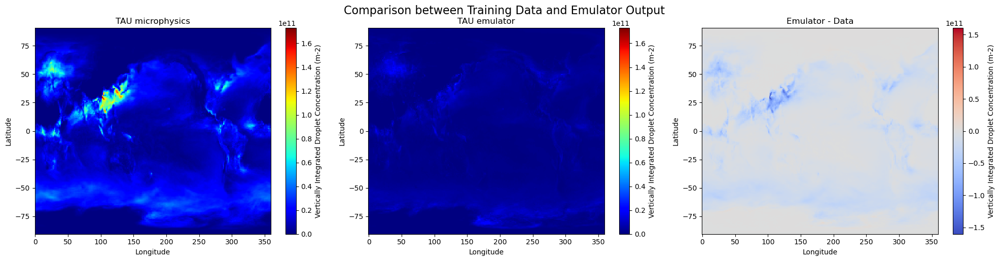

In [147]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), transform=ccrs.PlateCarree())

# Choose a timestep and atmospheric level
cdnumc_data_0 = datafile0.CDNUMC.sel({"time": datafile0.CDNUMC.time.values[0]}) # .squeeze()
cdnumc_nn_0 = nnfile0.CDNUMC.sel({"time": datafile0.CDNUMC.time.values[0]}) # .squeeze()

# define the colormap
cmap = mpl.colormaps["jet"]
minimum = np.min([cdnumc_data_0.min().values.item(), cdnumc_nn_0.min().values.item()])
maximum = np.max([cdnumc_data_0.max().values.item(), cdnumc_nn_0.max().values.item()])

# Plot the data
datamesh = axes[0].pcolormesh(cdnumc_data_0.lon, cdnumc_data_0.lat, cdnumc_data_0, cmap=cmap, vmin=minimum, vmax=maximum)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
plt.colorbar(datamesh, ax=axes[0], label=labels[4])

# Plot the emulator
nnmesh = axes[1].pcolormesh(cdnumc_nn_0.lon, cdnumc_nn_0.lat, cdnumc_nn_0, cmap=cmap, vmin=minimum, vmax=maximum)
plt.colorbar(nnmesh, ax=axes[1], label=labels[4])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Plot difference
cdnumc_diff_0 = cdnumc_nn_0 - cdnumc_data_0
min_diff = np.min(cdnumc_diff_0.min().values.item())
max_diff = np.max(cdnumc_diff_0.max().values.item())
abs_diff = max(abs(min_diff), abs(max_diff))
z = np.linspace(-abs_diff, abs_diff)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
diffmesh = axes[2].pcolormesh(cdnumc_diff_0.lon, cdnumc_diff_0.lat, cdnumc_diff_0, norm=norm, cmap="coolwarm")
plt.colorbar(diffmesh, ax=axes[2], label=labels[4])
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")

for ax, col in zip(axes, cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

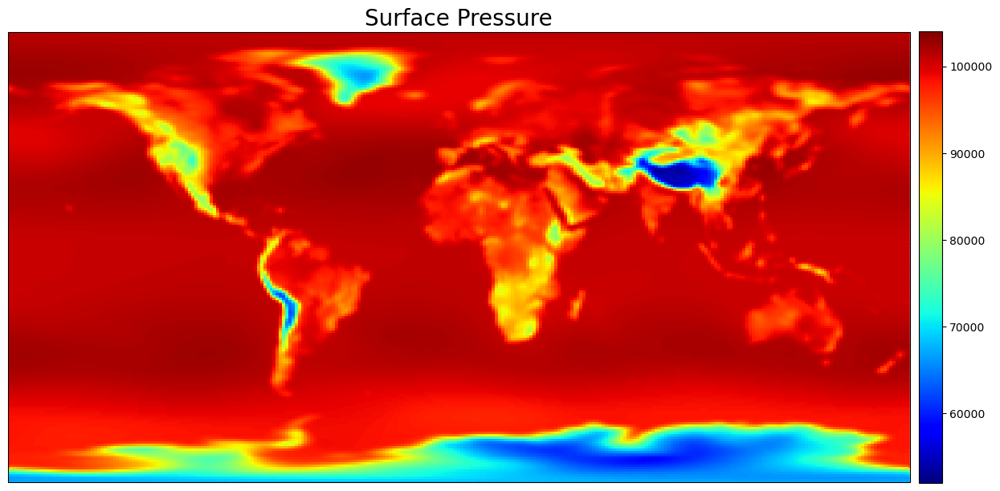

In [45]:
ps_data_0 = datafile0.PS.sel({"time": datafile0.PS.time.values[0]}) # .squeeze()
ps_data_0
# define the colormap
cmap = mpl.colormaps["jet"]

# set up the figure with a Plate Carree projection
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot the first timeslice of TS
img = ax.pcolormesh(ps_data_0.lon, ps_data_0.lat, ps_data_0, cmap=cmap, transform=ccrs.PlateCarree(), vmin=52000, vmax=104000)
plt.title("Surface Pressure", fontsize=20)

# Set up colorbar
plt.colorbar(img, orientation="vertical", fraction=0.0242, pad=0.01)
plt.show()

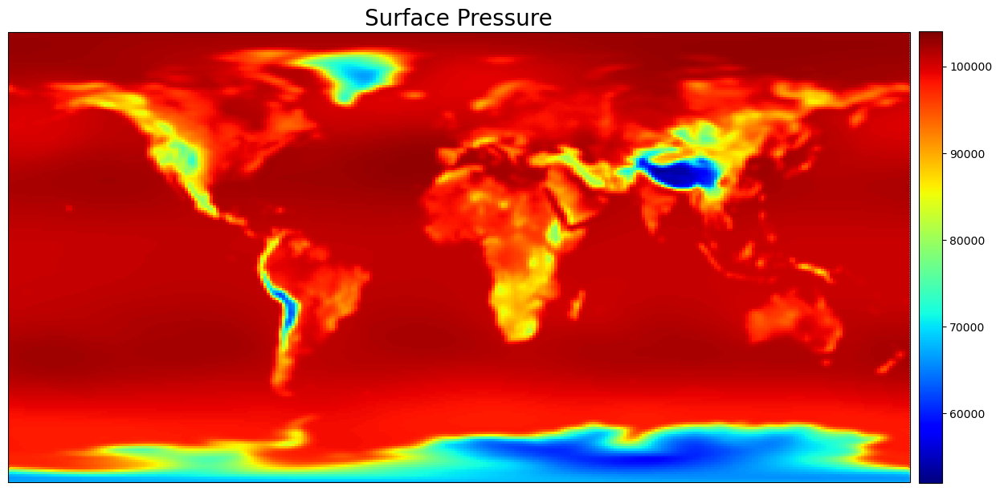

In [44]:
ps_nn_0 = nnfile0.PS.sel({"time": datafile0.PS.time.values[0]}) # .squeeze()
ps_nn_0
# define the colormap
cmap = mpl.colormaps["jet"]

# set up the figure with a Plate Carree projection
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot the first timeslice of TS
img = ax.pcolormesh(ps_nn_0.lon, ps_nn_0.lat, ps_nn_0, cmap=cmap, transform=ccrs.PlateCarree(), vmin=52000, vmax=104000)
plt.title("Surface Pressure", fontsize=20)

# Set up colorbar
plt.colorbar(img, orientation="vertical", fraction=0.0242, pad=0.01)
plt.show()

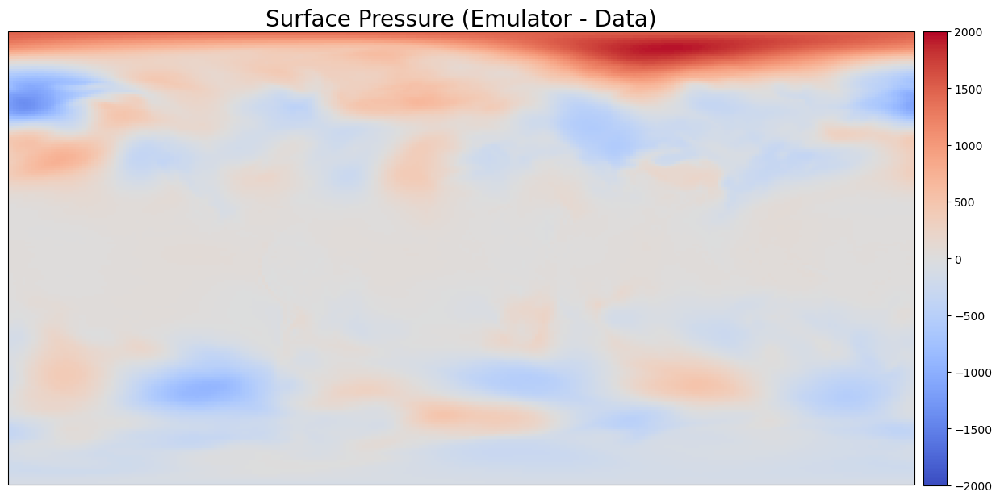

In [52]:
ps_diff_0 = ps_nn_0 - ps_data_0
# define the colormap
cmap = mpl.colormaps["coolwarm"]

# set up the figure with a Plate Carree projection
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot the first timeslice of TS
z = np.linspace(-2000, 2000)
norm = TwoSlopeNorm(vmin=z.min(), vcenter=0, vmax=z.max())
img = ax.pcolormesh(ps_diff_0.lon, ps_diff_0.lat, ps_diff_0, cmap=cmap, transform=ccrs.PlateCarree(), vmin=z.min(), vmax=z.max())
plt.title("Surface Pressure (Emulator - Data)", fontsize=20)

# Set up colorbar
plt.colorbar(img, orientation="vertical", fraction=0.0242, pad=0.01)
plt.show()

0
PS


KeyError: 'PS'

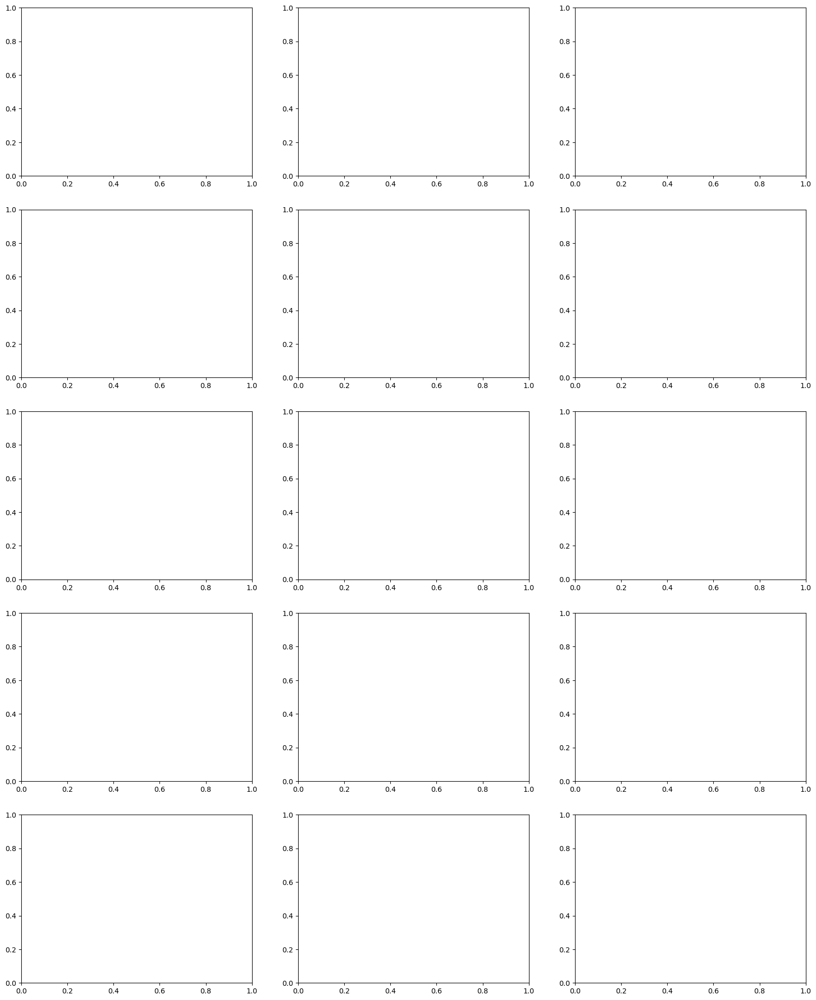

In [114]:
# Create subplots
fig, axes = plt.subplots(nrows=len(variables), ncols=3, figsize=(20, len(variables)*5))
for i, (variable, label) in enumerate(zip(variables, labels)):
    print(i)
    print(variable)
    data_var = datafile1[variable].mean(dim="lon").isel(time=0)
    nn_var = nnfile1[variable].mean(dim="lon").isel(time=0)
    if variable in ["qctend_TAU", "nctend_TAU", "nrtend_TAU"]:
        level_type = "trop_cld_lev"
    else:
        level_type = "lev"

    data_lev = data_var.coords[level_type]
    data_lat = data_var.coords["lat"]
    nn_lev = nn_var.coords[level_type]
    nn_lat = nn_var.coords["lat"]
    minimum = np.min([data_var.min().values.item(), nn_var.min().values.item()])
    maximum = np.max([data_var.max().values.item(), nn_var.max().values.item()])
    datamesh = axes[i, 0].pcolormesh(data_lat, data_lev, data_var, cmap='Reds', norm=colors.SymLogNorm(linthresh=1e-5))
    axes[i, 0].set_xlabel("Latitude")
    axes[i, 0].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 0].yaxis.set_inverted(True)
    plt.colorbar(datamesh, ax=axes[i, 0], label=labels[i])
    nnmesh = axes[i, 1].pcolormesh(nn_lat, nn_lev, nn_var, cmap='Reds', vmin=minimum, vmax=maximum)
    plt.colorbar(nnmesh, ax=axes[i, 1], label=labels[i])
    axes[i, 1].set_xlabel("Latitude")
    axes[i, 1].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 1].yaxis.set_inverted(True)

    diff_var = nn_var - data_var
    diff_lev = diff_var.coords[level_type]
    diff_lat = diff_var.coords["lat"]
    minimum = diff_var.min().values.item()
    maximum = diff_var.max().values.item()
    norm = mpl.colors.Normalize(vmin=minimum, vmax=maximum)
    diffmesh = axes[i, 2].pcolormesh(diff_lat, diff_lev, diff_var, norm=TwoSlopeNorm(0), cmap='coolwarm')
    plt.colorbar(diffmesh, ax=axes[i, 2], label=labels[i])
    axes[i, 2].set_xlabel("Latitude")
    axes[i, 2].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 2].yaxis.set_inverted(True)
for ax, col in zip(axes[0], cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
# plt.savefig(pwd+"cam_data_nn_comparisons_h0.png", dpi=300, bbox_inches="tight")
plt.show()

Analyzing the h1 files

In [12]:
# variables = ["CLDICE",
#              "CLDLIQ",
#              "qctend_TAU",
#              "nctend_TAU",
#              "nrtend_TAU",
#             ]
# labels = ["Cloud Ice",
#           "Cloud Liquid",
#           "Cloud mass mixing ratio tendency TAU",
#           "Cloud number mixing ratio tendency TAU",
#           "Rain number mixing ratio tendency TAU",
#          ]
variables = ["qctend_TAU",
             "nctend_TAU",
             "nrtend_TAU",
            ]
labels = ["Cloud mass mixing ratio tendency TAU",
          "Cloud number mixing ratio tendency TAU",
          "Rain number mixing ratio tendency TAU",
         ]
cols = ["{}".format(col) for col in ["TAU microphysics", 
                                     "TAU emulator",
                                     "Emulator - Data"
                                     ]
]

In [13]:
# mini = data_var.min().values.item()
# maxi = data_var.max().values.item()
# np.min([mini, maxi])

0
qctend_TAU


/glade/derecho/scratch/wchuang/tmp/ipykernel_28272/2008886577.py:23: UserWarning: All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 
  plt.colorbar(datamesh, ax=axes[i, 0], label=labels[i])


1
nctend_TAU
2
nrtend_TAU


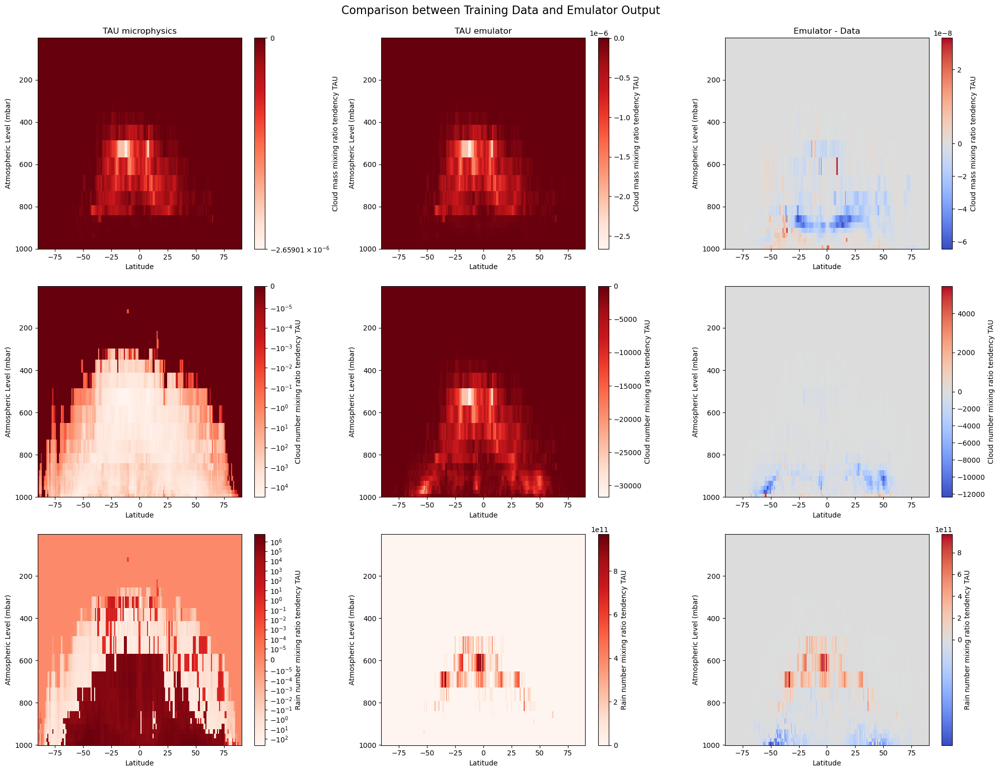

In [14]:
# Create subplots
fig, axes = plt.subplots(nrows=len(variables), ncols=3, figsize=(20, len(variables)*5))
for i, (variable, label) in enumerate(zip(variables, labels)):
    print(i)
    print(variable)
    data_var = datafile1[variable].mean(dim="lon").isel(time=0)
    nn_var = nnfile1[variable].mean(dim="lon").isel(time=0)
    if variable in ["qctend_TAU", "nctend_TAU", "nrtend_TAU"]:
        level_type = "trop_cld_lev"
    else:
        level_type = "lev"
        
    data_lev = data_var.coords[level_type]
    data_lat = data_var.coords["lat"]
    nn_lev = nn_var.coords[level_type]
    nn_lat = nn_var.coords["lat"]
    minimum = np.min([data_var.min().values.item(), nn_var.min().values.item()])
    maximum = np.max([data_var.max().values.item(), nn_var.max().values.item()])
    datamesh = axes[i, 0].pcolormesh(data_lat, data_lev, data_var, cmap='Reds', norm=colors.SymLogNorm(linthresh=1e-5))
    axes[i, 0].set_xlabel("Latitude")
    axes[i, 0].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 0].yaxis.set_inverted(True)
    plt.colorbar(datamesh, ax=axes[i, 0], label=labels[i])
    nnmesh = axes[i, 1].pcolormesh(nn_lat, nn_lev, nn_var, cmap='Reds', vmin=minimum, vmax=maximum)
    plt.colorbar(nnmesh, ax=axes[i, 1], label=labels[i])
    axes[i, 1].set_xlabel("Latitude")
    axes[i, 1].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 1].yaxis.set_inverted(True)
    
    diff_var = nn_var - data_var
    diff_lev = diff_var.coords[level_type]
    diff_lat = diff_var.coords["lat"]
    minimum = diff_var.min().values.item()
    maximum = diff_var.max().values.item()
    norm = mpl.colors.Normalize(vmin=minimum, vmax=maximum)
    diffmesh = axes[i, 2].pcolormesh(diff_lat, diff_lev, diff_var, norm=TwoSlopeNorm(0), cmap='coolwarm')
    plt.colorbar(diffmesh, ax=axes[i, 2], label=labels[i])
    axes[i, 2].set_xlabel("Latitude")
    axes[i, 2].set_ylabel("Atmospheric Level (mbar)")
    axes[i, 2].yaxis.set_inverted(True)
for ax, col in zip(axes[0], cols):
    ax.set_title(col)
plt.tight_layout()
fig.suptitle("Comparison between Training Data and Emulator Output", size=16, y=1.02)
plt.savefig(pwd+"cam_data_nn_comparisons_h1.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
plt.rcParams['figure.figsize'] = [10, 5]
var='TGCLDLWP'
tmp=amb.sel(variables=var)

fig,axs=plt.subplots(3,1,figsize=(10, 20))
axs = axs.ravel()

sns.set_context("talk")

diff=tmp.isel(runs=0)-tmp.isel(runs=1)

tmp.isel(runs=0).plot(ax=axs[0])
tmp.isel(runs=1).plot(ax=axs[1])
diff.plot(ax=axs[2])

TypeError: __init__() got an unexpected keyword argument 'range'

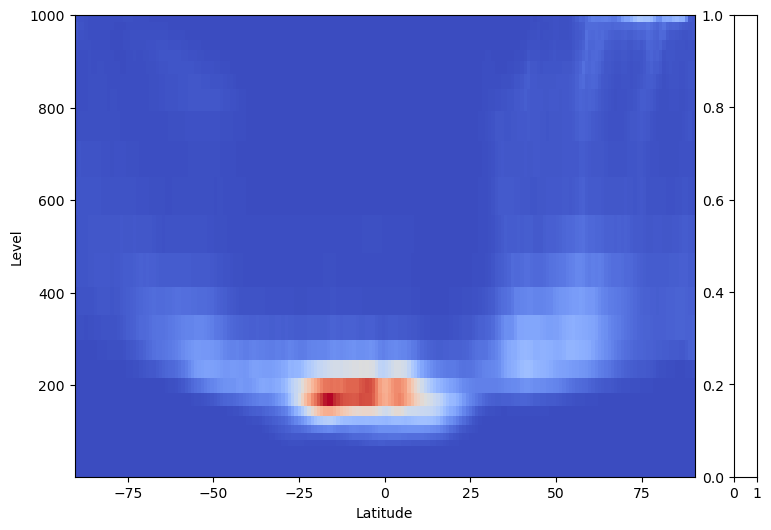

In [19]:
cldice_data = datafile0["CLDICE"].mean(dim="lon").isel(time=0)
level = datafile0.coords["lev"]
latitude = datafile0.coords["lat"]
plt.figure(figsize=(10, 6))
plt.pcolormesh(latitude, level, cldice_data, cmap='coolwarm')
plt.xlabel("Latitude")
plt.ylabel("Level")
cbar = plt.colorbar()
cbar.set_label("Data Cloud Ice") 
plt.title("Cloud Ice across Height and Latitude")
plt.grid(True)
plt.savefig(pwd+"cloud_ice_data_2", dpi=300, bbox_inches="tight")
plt.show()

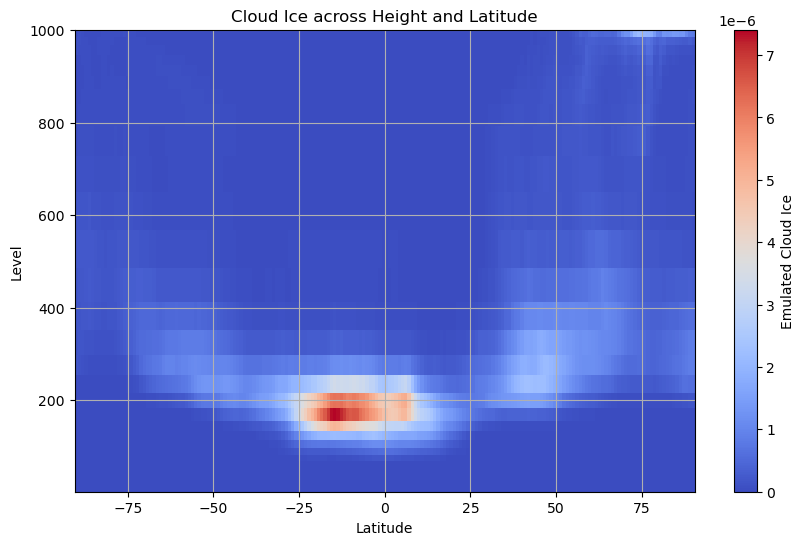

In [17]:
cldice = nnfile0["CLDICE"].mean(dim="lon").isel(time=0)
level = nnfile0.coords["lev"]
latitude = nnfile0.coords["lat"]
plt.figure(figsize=(10, 6))
plt.pcolormesh(latitude, level, cldice, cmap='coolwarm')
plt.xlabel("Latitude")
plt.ylabel("Level")
cbar = plt.colorbar()
cbar.set_label("Emulated Cloud Ice") 
plt.title("Cloud Ice across Height and Latitude")
plt.grid(True)
plt.savefig(pwd+"cloud_ice_nn.png", dpi=300, bbox_inches="tight")
plt.show()
# fig, ax = plt.subplots()


In [ ]:
cldice = nnfile0["CLDICE"].mean(dim="time").isel(time=0)
level = nnfile0.coords["lev"]
latitude = nnfile0.coords["lat"]
plt.figure(figsize=(10, 6))
plt.pcolormesh(latitude, level, cldice, cmap='coolwarm')
plt.xlabel("Latitude")
plt.ylabel("Level")
cbar = plt.colorbar()
cbar.set_label("Emulated Cloud Ice") 
plt.title("Cloud Ice across Height and Latitude")
plt.grid(True)
plt.show()

Choose a latitude and longitude

In [26]:
lat = 40.05 
lon = 100.0

Pressure vs time

In [37]:
# Select all times for a specific latitude and longitude
data_sel = datafile.sel(lat=lat, lon=lon, method="nearest")

# Extract variables
data_sel

<xarray.Dataset>
Dimensions:       (lev: 32, ilev: 33, trop_cld_lev: 32, time: 32, nbnd: 2)
Coordinates:
    lat           float64 40.05
    lon           float64 100.0
  * lev           (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev          (ilev) float64 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * trop_cld_lev  (trop_cld_lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * time          (time) object 2005-01-01 00:00:00 ... 2005-01-30 17:00:00
Dimensions without coordinates: nbnd
Data variables: (12/45)
    gw            float64 dask.array<chunksize=(), meta=np.ndarray>
    hyam          (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    hybm          (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    P0            float64 ...
    hyai          (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    hybi          (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    ...            ...
    RHO_CLUBB     (time, lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    T             (time, lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    nctend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    nrtend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qctend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qrtend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              cam_ml_tauREV4_train
    logname:           andrew
    host:              derecho4
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  hour_23

In [ ]:
nnfile["CLDICE"]

In [36]:
# Select all times for a specific latitude and longitude
nn_sel = nnfile.sel(lat=lat, lon=lon, method='nearest')

# Extract variables
nn_sel["Z3"]

<xarray.Dataset>
Dimensions:       (lev: 32, ilev: 33, trop_cld_lev: 32, time: 32, nbnd: 2)
Coordinates:
    lat           float64 40.05
    lon           float64 100.0
  * lev           (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev          (ilev) float64 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * trop_cld_lev  (trop_cld_lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * time          (time) object 2005-01-01 00:00:00 ... 2005-01-30 17:00:00
Dimensions without coordinates: nbnd
Data variables: (12/50)
    gw            float64 dask.array<chunksize=(), meta=np.ndarray>
    hyam          (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    hybm          (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    P0            float64 ...
    hyai          (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    hybi          (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    ...            ...
    nr_fixer      (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    nrtend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qc_fixer      (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qctend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qr_fixer      (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
    qrtend_TAU    (time, trop_cld_lev) float64 dask.array<chunksize=(32, 32), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              run12_3nn_add_CLD_lev_FREQR
    logname:           wchuang
    host:              derecho6
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  hour_23

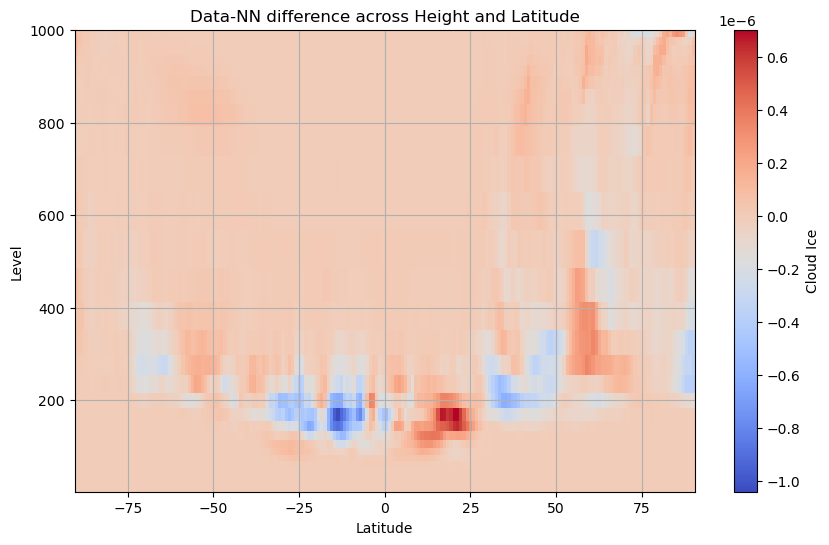

In [11]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(latitude, level, temperature_data - temperature, cmap='coolwarm')
plt.xlabel("Latitude")
plt.ylabel("Level")
plt.title("Data-NN difference across Height and Latitude")
cbar = plt.colorbar()
cbar.set_label("Cloud Ice")
plt.grid(True)
plt.show()

In [27]:
datafile

<xarray.Dataset>
Dimensions:           (lat: 192, lon: 288, lev: 32, ilev: 33, trop_cld_lev: 32,
                       time: 1, nbnd: 2)
Coordinates:
  * lat               (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon               (lon) float64 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
  * lev               (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * ilev              (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * trop_cld_lev      (trop_cld_lev) float64 3.643 7.595 14.36 ... 976.3 992.6
  * time              (time) object 2005-02-01 00:00:00
Dimensions without coordinates: nbnd
Data variables: (12/589)
    gw                (lat) float64 dask.array<chunksize=(192,), meta=np.ndarray>
    hyam              (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    hybm              (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    P0                float64 ...
    hyai              (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    hybi              (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    ...                ...
    RTP2_CLUBB        (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    THLP2_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    RTPTHLP_CLUBB     (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPRCP_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPTHVP_CLUBB      (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    ZM_CLUBB          (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              cam_ml_tauREV4_train
    logname:           andrew
    host:              derecho4
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  month_1

In [14]:
cldice = openfile["CLDICE"]

<xarray.Dataset>
Dimensions:           (lat: 192, lon: 288, lev: 32, ilev: 33, trop_cld_lev: 32,
                       time: 1, nbnd: 2)
Coordinates:
  * lat               (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon               (lon) float64 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
  * lev               (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * ilev              (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * trop_cld_lev      (trop_cld_lev) float64 3.643 7.595 14.36 ... 976.3 992.6
  * time              (time) object 2005-02-01 00:00:00
Dimensions without coordinates: nbnd
Data variables: (12/594)
    gw                (lat) float64 dask.array<chunksize=(192,), meta=np.ndarray>
    hyam              (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    hybm              (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    P0                float64 ...
    hyai              (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    hybi              (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    ...                ...
    RTP2_CLUBB        (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    THLP2_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    RTPTHLP_CLUBB     (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPRCP_CLUBB       (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    WPTHVP_CLUBB      (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
    ZM_CLUBB          (time, ilev, lat, lon) float64 dask.array<chunksize=(1, 33, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              run11_1month
    logname:           wchuang
    host:              derecho2
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  month_1

(array([1.740013e+06, 1.969900e+04, 6.436000e+03, 2.191000e+03,
        7.320000e+02, 2.460000e+02, 8.800000e+01, 4.000000e+01,
        1.700000e+01, 1.000000e+01]),
 array([9.72367329e-83, 3.63891394e-06, 7.27782788e-06, 1.09167418e-05,
        1.45556558e-05, 1.81945697e-05, 2.18334837e-05, 2.54723976e-05,
        2.91113115e-05, 3.27502255e-05, 3.63891394e-05]),
 <BarContainer object of 10 artists>)

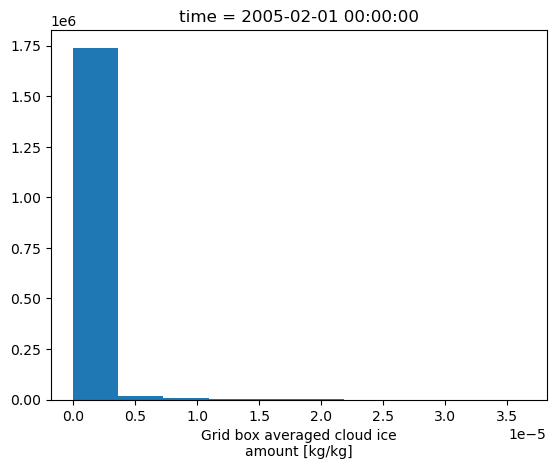

In [21]:
cldice.plot()